# GTDHF ~ Code and results

This notebook contains all of the code used in the report covering General Time-Dependent Hartree-Fock written by Brage Brevig and Karl Henrik Fredly.

It is divided into five parts:
- Setup of the system: Setting up the basis functions and integrals between them using the quantum_systems library.
- The Self Consistent Field method: Calculating time independent values and performing the self consistent field method to minimize energy and find C.
- TDHF: Time evolving the ground state found in the previous part with a constant sinusoidal laser field.
- FFT: Time evolving after a laser pulse and analyzing the result using the Fourier transform.
- Animation: Animating the time evolution of the ground state with a constant sinusoidal laser field.

## Setup of system

In [1]:
import numpy as np
np.set_printoptions(precision=2) # 2 decimals when printing arrays
np.set_printoptions(suppress=True) # No scientific notation for small numbers
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 15})
from scipy.integrate import complex_ode

from numba import njit

from quantum_systems import ODQD, GeneralOrbitalSystem # library developed by Øyvind Schøyen and others, https://github.com/Schoyen/quantum-systems

import matplotlib.animation as animation
import matplotlib.image as mpimg
from IPython.display import HTML

In [2]:
l_0 = 10                # number of basis functions
grid_length = 10        # compute from x = -10 to x = 10 in 1D
num_grid_points = 2001
omega = 0.25            # strength of harmonic oscillator potential
n = 2                   # number of particles

# this sets up the harmonic oscillator basis functions and integrals between them
odho = ODQD(l_0, grid_length, num_grid_points, a = 0.25, alpha = 1, potential = ODQD.HOPotential(omega))

# this makes a spin up and spin down variant of the odho basis function and sets up the integrals between them
system = GeneralOrbitalSystem(n = n, basis_set=odho)

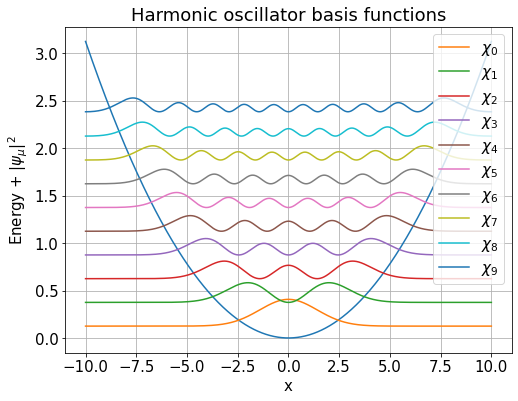

In [34]:
fig = plt.figure(figsize=(8, 6))

plt.plot(odho.grid, ODQD.HOPotential(omega)(odho.grid))

for i in range(0, system.l, 2):
    plt.plot(odho.grid, np.abs(odho.spf[i]) ** 2 + odho.h[i, i].real, label=r"$\chi_{" + f"{i//2}" + r"}$")

plt.xlabel("x")
plt.ylabel(r"Energy + |$\psi_\mu$|$^2$")
plt.title("Harmonic oscillator basis functions")
plt.grid()
plt.legend()
plt.show()

## The Self Consistent Field method

In [4]:
@njit
def getP(C, n):
    l = C.shape[0]
    P = np.zeros((l, l), dtype="c16")
    
    for a in range(l):
        for b in range(l):
            for i in range(n):
                P[b, a] += np.conj(C[a, i]) * C[b, i]
    return P

@njit
def getF(C, h, u, n):
    l = C.shape[0]
    F = np.zeros((l, l), dtype="c16")
    P = getP(C, n)
    
    F += h
    for a in range(l):
        for b in range(l):
            for c in range(l):
                for d in range(l):
                    F[a, b] += P[d, c] * u[a, c, b, d]
    return F

In [30]:
def SCF(C, system, iters):
    for i in range(iters):
        F = getF(C, system.h, system.u, system.n)
        _, C = np.linalg.eigh(F)
    return C

In [6]:
C_initial = np.eye(system.l, dtype="c16")

C = SCF(C_initial, system, 20)
C_GHF = SCF(C_initial, system, 20000)

In [7]:
def getDensity(C, system):
    grid = system.spf[0].shape[0] # gridpoints
    scale = grid / system.grid[-1] # avg value per point on the grid
    n = system.n
    density = np.zeros((n, grid))
    
    for i in range(n):
        phi_i = C[:, i] # molecular orbital for particle i
        density[i] += np.abs(np.einsum("i, ij -> j", phi_i[::2], system.spf[::2]))**2 # spin up
        density[i] += np.abs(np.einsum("i, ij -> j", phi_i[1::2], system.spf[1::2]))**2 # spin down
        density[i] *= scale / np.sum(density[i])
        
    tot_density = np.sum(density, axis = 0)
    tot_density *= scale / np.sum(tot_density)
    
    return tot_density, density

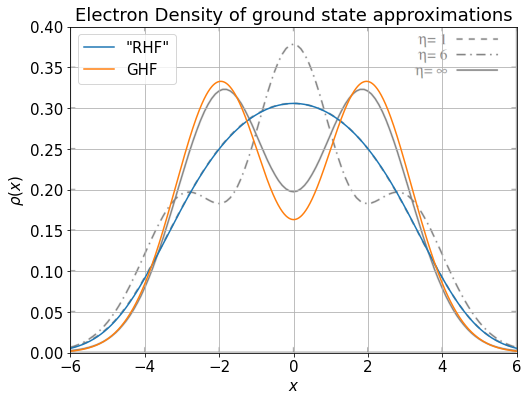

In [8]:
dens, dens_all = getDensity(C, system)
dens_GHF, dens_GHF_all = getDensity(C_GHF, system)

plt.figure(figsize=(8,6))
plt.plot(system.grid, dens, label=r'"RHF"')
plt.plot(system.grid, dens_GHF, label=r"GHF")
img=mpimg.imread('Zang Images/GS.PNG')
plt.imshow(img, extent=[-6, 6, 0, 0.4], aspect='auto', alpha = 0.5)

plt.xlim(-6, 6)
plt.xlabel(r'$x$')
plt.ylabel(r'$\rho (x)$')
plt.grid()
plt.legend(loc = "upper left")
plt.title("Electron Density of ground state approximations")
plt.show()

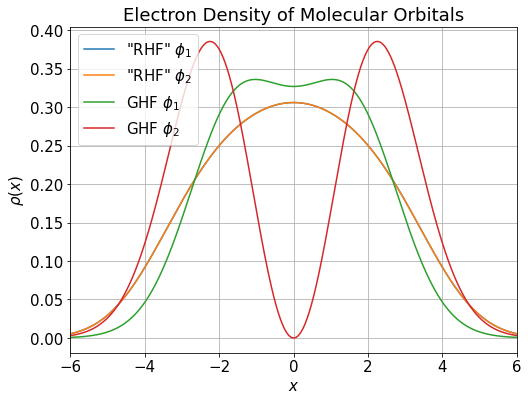

In [9]:
plt.figure(figsize=(8,6))
plt.plot(system.grid, dens_all[0], label=r'"RHF" $\phi_1$')
plt.plot(system.grid, dens_all[1], label=r'"RHF" $\phi_2$')
plt.plot(system.grid, dens_GHF_all[0], label=r"GHF $\phi_1$")
plt.plot(system.grid, dens_GHF_all[1], label=r"GHF $\phi_2$")

plt.xlim(-6, 6)
plt.xlabel(r'$x$')
plt.ylabel(r'$\rho (x)$')
plt.grid()
plt.legend(loc = "upper left")
plt.title("Electron Density of Molecular Orbitals")
plt.show()

In [10]:
for i in range(system.l):
    print(f"{i+1} & {C[:, 0].real[i]:.2f} & {C[:, 1].real[i]:.2f} & {C_GHF[:, 0].real[i]:.2f} & {C_GHF[:, 1].real[i]:.2f} \\\\")

1 & -0.31 & 0.88 & -0.05 & -0.00 \\
2 & 0.88 & 0.31 & 0.96 & 0.00 \\
3 & -0.00 & -0.00 & -0.00 & 0.05 \\
4 & 0.00 & -0.00 & 0.00 & -0.99 \\
5 & 0.11 & -0.33 & 0.01 & 0.00 \\
6 & -0.33 & -0.11 & -0.26 & -0.00 \\
7 & 0.00 & 0.00 & 0.00 & -0.01 \\
8 & -0.00 & 0.00 & -0.00 & 0.11 \\
9 & -0.03 & 0.08 & 0.00 & 0.00 \\
10 & 0.08 & 0.03 & -0.03 & -0.00 \\
11 & -0.00 & -0.00 & 0.00 & -0.00 \\
12 & 0.00 & -0.00 & -0.00 & 0.01 \\
13 & 0.00 & -0.00 & 0.00 & 0.00 \\
14 & -0.00 & -0.00 & -0.01 & -0.00 \\
15 & -0.00 & -0.00 & 0.00 & -0.00 \\
16 & 0.00 & -0.00 & -0.00 & 0.00 \\
17 & 0.00 & -0.00 & 0.00 & 0.00 \\
18 & -0.00 & -0.00 & -0.00 & -0.00 \\
19 & -0.00 & -0.00 & 0.00 & -0.00 \\
20 & 0.00 & -0.00 & -0.00 & 0.00 \\


In [11]:
@njit
def expected_energy(C, h, u, n):
    l = C.shape[0]
    P = getP(C, n)
    
    energy = 0
    for a in range(l):
        for b in range(l):
            energy += P[b, a] * h[a, b]
            for c in range(l):
                for d in range(l):
                    energy += 0.5 * P[b, a] * P[d, c] * u[a, c, b, d]
    return energy.real

@njit
def expected_position(C, position, n):
    l = C.shape[0]
    P = getP(C, n)
    
    pos = 0
    for a in range(l):
        for b in range(l):
            pos += P[b, a] * position[0][a, b]
    return pos.real

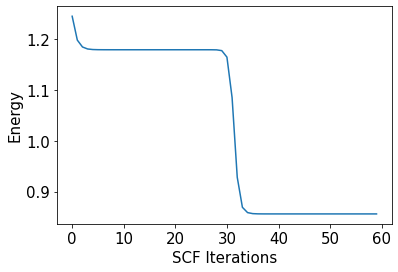

In [32]:
energies = np.zeros(60)
C_e = C_initial
for i in range(60):
    F = getF(C_e, system.h, system.u, system.n)
    _, C_e = np.linalg.eigh(F)
    energies[i] = expected_energy(C_e, system.h, system.u, system.n)
    
plt.plot(energies)
plt.xlabel("SCF Iterations")
plt.ylabel("Energy")
plt.show()

In [12]:
print(f"GS energy (RHF): {expected_energy(C, system.h, system.u, system.n):.6f}")
print(f"GS energy (GHF): {expected_energy(C_GHF, system.h, system.u, system.n):.6f}")
print(f"Reference: {1.1795}")
print(f'"Exact"  : {0.8247}')

GS energy (RHF): 1.179579
GS energy (GHF): 0.845040
Reference: 1.1795
"Exact"  : 0.8247


## TDHF

In [13]:
class RHS(object):
    def __init__(self, system, eps_0, omega_e, envelope = False, T = 1):
        self.system = system
        
        self.eps_0 = eps_0
        self.omega_e = omega_e
        if envelope:
            self.laser = self.envelope
            self.T = T
        else:
            self.laser = self.weak_laser
        
    def weak_laser(self, t):
        return self.eps_0 * np.sin(self.omega_e * t)
    
    def envelope(self, t):
        return np.where(t < self.T, #if this
                           self.weak_laser(t), #return this
                           0) #else return this
    
    def __call__(self, t, C):
        system = self.system
        C = C.reshape(system.l, system.l)
        F = getF(C, system.h, system.u, system.n) - system.position[0] * self.laser(t)
        Cdot = -1j * F @ C

        return Cdot.reshape(-1)

In [14]:
def tdhf(C, system, f, t1, dt):
    # Setup integration parameters
    y0 = C.reshape(-1)
    t0 = 0
    N = int((t1 - t0) / dt) + 10 # making N large enough with good margin

    y = np.zeros((N, y0.shape[0]), dtype="c16")
    y[0] = y0
    t = np.zeros(N)
    t[0] = t0
    
    # Setting up integrator and performing integration
    r = complex_ode(f).set_integrator('vode')
    r.set_initial_value(y0, t0)
    i = 1
    while r.successful() and r.t < t1:
        y[i] = r.integrate(r.t + dt)
        t[i] = r.t
        i += 1

    # Removing the safety zeroes at the end
    t = t[:i]
    y = y[:i]
        
    return t, y

In [15]:
def analyze_time_evolution(system, t, y, T = 0):
    N = y.shape[0]
    energy = np.zeros(N)
    pos = np.zeros(N)
    overlap = np.zeros(N)

    N0 = int(T // dt) # time when temporary laser stops
    C0 = y[N0, :].reshape(system.l, system.l)[:, 0:system.n] # Occupied columns of C at time T

    for i in range(N):
        Ci = y[i, :].reshape(system.l, system.l) # C at time i
        Ci_dag = np.conj(Ci[:, 0:system.n]).T

        energy[i] = expected_energy(Ci, system.h, system.u, system.n)
        pos[i] = expected_position(Ci, system.position, system.n)
        overlap[i] = np.abs(np.linalg.det(Ci_dag @ C0))**2 # overlap integral
        
    return energy, pos, overlap

In [16]:
eps_0 = 1
omega_e = 8 * omega

t1 = 4 * np.pi
dt = 0.001
time_unit = np.pi # 2 * np.pi / omega_e = pi

# Simulating time evolution
f = RHS(system, eps_0, omega_e)
t, y = tdhf(C, system, f, t1, dt)
t_GHF, y_GHF = tdhf(C_GHF, system, f, t1, dt)
# Extracting useful values from time evolution
energy, pos, overlap = analyze_time_evolution(system, t, y)
energy_GHF, pos_GHF, overlap_GHF = analyze_time_evolution(system, t_GHF, y_GHF)

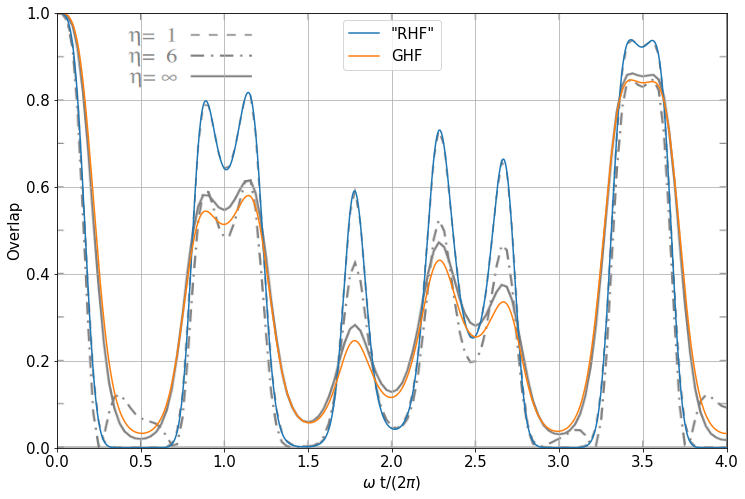

In [17]:
plt.figure(figsize=(12, 8))

plt.plot(t / time_unit, overlap, label = '"RHF"')
plt.plot(t_GHF / time_unit, overlap_GHF, label = "GHF")

img=mpimg.imread("Zang Images/TD.PNG")
plt.imshow(img, extent=[0, 4, 0, 1], aspect='auto', alpha = 0.5)

plt.xlabel(r"$\omega$ t/(2$\pi$)")
plt.ylabel("Overlap")
plt.legend()
plt.grid()
plt.show()

## FFT

In [18]:
def fft_these(signals, times, labels, title, xlim, time_unit = np.pi):
    plt.figure(figsize=(8, 13))
    
    plt.subplot(211)
    for signal, time, label in zip(signals, times, labels):
        plt.plot(time / time_unit, signal, label = label) 
    plt.title(title)
    plt.xlabel("$\omega$ t/(2$\pi$)")
    plt.ylabel("Amplitude")
    plt.legend(loc = "upper right")

    plt.subplot(212)
    for signal, time, label in zip(signals, times, labels):
        N = len(time)
        dt = time[1] - time[0]
        freqs = np.fft.fftfreq(n = N, d = dt)[:N//2] * 2 * np.pi
        fftGen = np.abs(np.fft.fft(signal) / N)[:N//2]
        
        plt.plot(freqs, fftGen, label = label)
        idx = np.argmax(np.abs(fftGen[:N//2]))
        print(f"Dominant frequency for {label} = {freqs[idx]:.2f} +- {freqs[1] - freqs[0]:.2f}")
    plt.title(f"Absolute value of FFT of {title}")
    plt.xlabel("Angular Frequency")
    plt.ylabel("Relative intensity")
    plt.xlim(-0.05, xlim)
    plt.legend(loc = "upper right")

    plt.show()

In [19]:
eps_p = 1
omega_p = 8 * omega

T = 1 * np.pi
t1_p = 200 * np.pi + T
dt_p = 0.1

N0 = int(T // dt_p)

f_p = RHS(system, eps_p, omega_p, envelope = True, T = T)
t_p, y_p = tdhf(C, system, f_p, t1_p, dt_p)
t_p_GHF, y_p_GHF = tdhf(C_GHF, system, f_p, t1_p, dt_p)

energy_p, pos_p, overlap_p = analyze_time_evolution(system, t_p, y_p, T)
energy_p_GHF, pos_p_GHF, overlap_p_GHF = analyze_time_evolution(system, t_p_GHF, y_p_GHF, T)

Dominant frequency for GHF = 0.25 +- 0.01
Dominant frequency for "RHF" = 0.25 +- 0.01


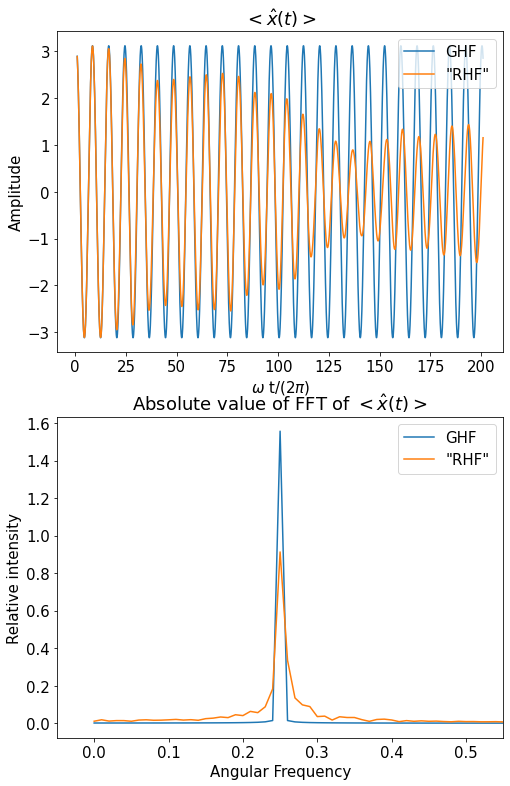

In [20]:
positions = [pos_p_GHF[N0:], pos_p[N0:]]
times = [t_p_GHF[N0:], t_p[N0:]]
labels = ["GHF", '"RHF"']
fft_these(positions, times, labels, r"$<\hat{x}(t)>$", 0.55)

Dominant frequency for GHF = 0.00 +- 0.01
Dominant frequency for "RHF" = 0.00 +- 0.01


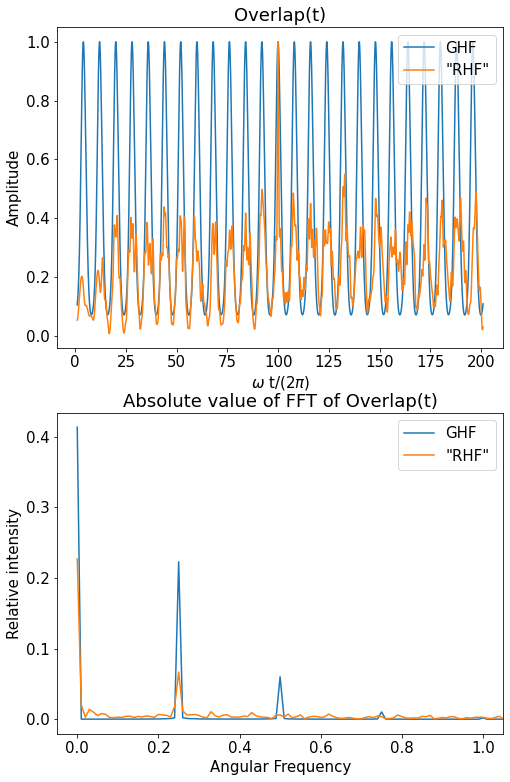

In [21]:
overlaps = [overlap_p_GHF[N0:], overlap_p[N0:]]
fft_these(overlaps, times, labels, "Overlap(t)", 1.05)

## Animation

In [22]:
def animate(system, t, y):
    times = [i for i in range(0, len(t), len(t)//200)] # choosing a selection of evenly spaced times to animate
    wf_amp = np.zeros((len(times), system.spf.shape[1]))

    for i, time_idx in enumerate(times):
        Ci = y[time_idx, :].reshape(system.l, system.l)
        wf_amp[i], _ = getDensity(Ci, system)

    fig, ax = plt.subplots()
    fig.set_size_inches(8, 6)
    plt.plot(system.grid, ODQD.HOPotential(omega)(system.grid), label = "HO")
    line, = ax.plot(system.grid, wf_amp[0], label = r"$|\phi(x, t)|^2$")
    plt.xlim(-6, 6)
    plt.ylim(0, 0.4)
    plt.legend(loc = "upper right")
    ax.grid()
    
    timer = plt.text(0.88, 0.05, "", bbox={'facecolor':'w', 'alpha':0.5, 'pad':5},
                transform=ax.transAxes, ha="center")

    def update(i):
        line.set_ydata(wf_amp[i])
        timer.set_text(f"Time = {t[times[i]] / np.pi:.2f}")

    plt.close()
    
    return animation.FuncAnimation(fig, update, frames = len(times), interval=30)

In [23]:
ani = animate(system, t, y)
Writer = animation.writers['ffmpeg']
writer = Writer(fps=15, metadata=dict(artist='Me'), bitrate=1800)

ani.save('Animation/RHF.mp4', writer=writer)
HTML(ani.to_jshtml())

In [24]:
ani = animate(system, t_GHF, y_GHF)
Writer = animation.writers['ffmpeg']
writer = Writer(fps=15, metadata=dict(artist='Me'), bitrate=1800)

ani.save('Animation/GHF.mp4', writer=writer)
HTML(ani.to_jshtml())